# TP 1 et 2: Linear Discriminant Analysis (LDA)


Enseignants: 

    S. Zhang (2022), J. Chirinos-Rodriguez (2025) (jonathaneduardo.chirinosrodriguez@toulouse-inp.fr)


Ce TP couvre **2 séances**. Le but est de classifier des simulations du milieu interstellaire. Nous allons réaliser des analyses discriminantes linéaires (LDA) en utilisant différents estimateurs statistiques :
1. la moyenne empirique
2. la matrice d'autocovariance empirique
3. le spectre de puissance

On comparera ensuite les performances de ces différentes méthodes.

On pourra se référer à cette page Wikipédia sur la LDA: https://fr.wikipedia.org/wiki/Analyse_discriminante_lin%C3%A9aire

**Evaluation :**
Ce notebook sera évalué. Il comptera pour 15% de la note finale. Le notebook devra être rendu avant le **06 Juin 2025**.

Critères d'évaluation : 
- code qui tourne (sans retourner d'erreur) et est-ce que le code répond à la question.
- clareté : commentaires, docstrings pour les fonctions, axes, titre et légende sur les plots...
- effort de recherche et mise en application des concepts du cours.

**Acknowledgements: L. Mousset (2023), P. Richard (2024)**

In [70]:
# Pour les plots
%matplotlib inline
import matplotlib.pyplot as plt

# Calcul scientifique
import numpy as np
import scipy
from scipy.fft import fft2

# Librairie maison dans le dossier avec les notebooks
from utils import bin_to_float, convert_cls2fls, save_obj, load_obj

# Librairie Scikit Learn
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay


import os

## Charger les données

On va utiliser des cartes (256x256) pixels, ce sont des simulations du milieu interstellaire. Plusieurs jeux de simulations ont été réalisés en variant deux paramètres physiques : le champ magnétique et la température. En fonction des valeurs de ces deux paramètres, on a pu définir 9 classes. 

On lit les données qui sont stockées dans le dossier `data/`. Les cartes sont séparées en deux catégories:
- Train : les données d'apprentissage (= d'entrainement)
- Test : les données de validation réservées aux tests

Chaque catégorie est séparée en 9 classes. Pour la catégorie Train, chaque classe contient 20 images alors que pour la catégorie Test, chaque classe contient 15 images.

Les images sont stockées en format binaire dans des fichiers `.dat`. Ces fichiers sont des tableaux 1D (256x256x8) où le 8 correspond aux 8 bytes.

In [2]:
# Paramètres
NbClasses = 9
SizeMaps = 256
TrainBaseFolder = './data/LearnEchantillons'
NbMapsTrain = 20
TestBaseFolder = './data/ClassEchantillons'
NbMapsTest = 15

**0.1 TODO :** Ecrire une fonction qui charge les données. Elle doit retourner un dictionnaire de numpy arrays (#Images, 256, 256), chaque élément du dictionnaire correspondant à une classe. On pourra utiliser la fonction `np.fromfile()`.

In [3]:
def read_imgs(BaseFolder: str, NbClasses: int, NbMaps: int, SizeMaps: int) -> dict:
    """
    Reads binary image data stored in .dat files organized by class folders.

    Parameters:
        BaseFolder (str): The root directory containing subfolders for each class (named '1', '2', ..., 'NbClasses').
        NbClasses (int): The number of classes (i.e., subfolders).
        NbMaps (int): The number of .dat files (maps) to read per class.
        SizeMaps (int): The height and width of each square image/map.

    Returns:
        dict: A dictionary where the keys are class indices (int), and the values are NumPy arrays
              of shape (NbMaps, SizeMaps, SizeMaps) containing the image data for each class.
    """
    imgs_cls = {}  ## initialization of the dictionary to hold image data for each class

    for i in range(1, NbClasses + 1):  ## iteration over each class
        class_folder = os.path.join(BaseFolder, str(i))  ## build the path to the current class folder
        imgs = np.zeros((NbMaps, SizeMaps, SizeMaps), dtype=np.float64)  ## create an array to store maps for this class

        ## List all .dat files in the current class folder
        files = [f for f in os.listdir(class_folder) if f.endswith('.dat')]

        for j in range(1, NbMaps + 1):  ## read each .dat file expected for this class
            file_path = os.path.join(class_folder, f'{j}.dat')  ## construct the full file path
            try:
                ## read the binary data and reshape it into a 2D array
                imgs[j - 1] = np.fromfile(file_path, dtype=np.float64, count=SizeMaps * SizeMaps).reshape((SizeMaps, SizeMaps))
            except Exception as e:
                ## print an error message if file reading fails
                print(f"Error for file {file_path} : {e}")

        ## store the 3D array of maps in the dictionary with class index as the key
        imgs_cls[i] = imgs
        
    return imgs_cls  ## return the dictionary of images

**0.2 TODO :** En appliquant la fonction `read_imgs()`, contruire 2 dictionnaires avec les données Test et les données Train

In [4]:
## apply read_imgs for the train & test folders
ImgsTrain = read_imgs(TrainBaseFolder, NbClasses, NbMapsTrain, SizeMaps)
ImgsTest = read_imgs(TestBaseFolder, NbClasses, NbMapsTest, SizeMaps)

**0.3 TODO :**  Sauver chaque dictionnaire sous la forme d'un fichier pickles. On utilisera la fonction `save_obj()` de `utils.py()`.

In [5]:
# from utils import save_obj
save_obj(ImgsTrain, "ImgsTrain")
save_obj(ImgsTest, "ImgsTest")

Remarque: Ces fichiers peuvent être chargés avec la fonction `load_obj`. Cela sera utile pour les prochains TPs.

In [6]:
ImgsTrain = load_obj('ImgsTrain')
ImgsTest = load_obj('ImgsTest')

**0.4 TODO :** Afficher des images de différentes classes. Peut-on différencier les classes à l'oeil nu ?

In [7]:
def display_sample_images(imgs_dict, nb_classes):
    """
    Displays the first image of each class from a dictionary of images.

    Parameters:
        imgs_dict (dict): A dictionary where keys are class indices and values are NumPy arrays
                          of shape (NbMaps, SizeMaps, SizeMaps), containing the image data.
        nb_classes (int): The number of classes to display.

    Returns:
        None: This function displays a plot and does not return anything.
    """
    plt.figure(figsize=(15, 5))  ## setting the overall size of the figure

    for i in range(1, nb_classes + 1):
        img = imgs_dict[i][0]  ## select the first image (index 0) of class i

        ## create a subplot for each class (shifted by +1 to avoid using subplot index 0)
        plt.subplot(1, nb_classes + 1, i + 1)
        plt.imshow(img, cmap='viridis')  ## sisplay the image using a color map
        plt.title(f"Class {i}")  ## set the title of the subplot
        plt.axis('off')  ## hide the axis for better visual clarity

    plt.tight_layout()  ## adjust layout to prevent overlap
    plt.show()  ## display the final figure

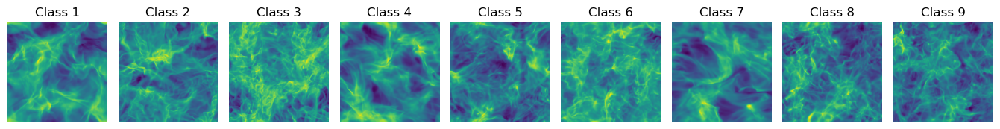

In [8]:
## display for ImagTrain
display_sample_images(ImgsTrain, NbClasses)


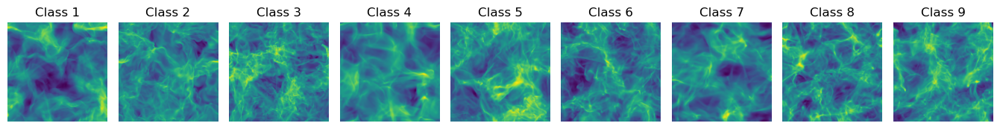

In [9]:
## display for ImgsTest
display_sample_images(ImgsTest, NbClasses)

**0.5 TODO :** Quelles conditions aux limites vérifient ces images ? On pourra faire un plot d'une image en utilisant la fonction `np.roll()` (https://stackoverflow.com/questions/19878280/efficient-way-to-shift-2d-matrices-in-both-directions).

In [10]:

def display_rolled_images(imgs_dict, nb_classes):
    """
    Displays the original and shifted (rolled) versions of the first image from each class.

    For each class:
      - The original image
      - A vertically rolled image (shifted along rows)
      - A horizontally rolled image (shifted along columns)

    Parameters:
        imgs_dict (dict): A dictionary where each key is a class index (int), and each value
                          is a NumPy array of shape (NbMaps, SizeMaps, SizeMaps).
        nb_classes (int): The number of classes to visualize.

    Returns:
        None: The function shows a plot and returns nothing.
    """
    plt.figure(figsize=(5, 2 * nb_classes))  ## setting figure size depending on number of classes

    for i in range(1, nb_classes + 1):
        img = imgs_dict[i][0]  ## get the first image of class i

        ## apply vertical and horizontal roll 
        img_roll_vert = np.roll(img, shift=50, axis=0)   ## shift rows
        img_roll_horiz = np.roll(img, shift=50, axis=1)  ## shift columns

        ## plot original image
        plt.subplot(nb_classes, 3, (i - 1) * 3 + 1)
        plt.imshow(img, cmap='viridis')
        plt.title(f'Class {i} - Original')
        plt.axis('off')

        ## plot vertically rolled image
        plt.subplot(nb_classes, 3, (i - 1) * 3 + 2)
        plt.imshow(img_roll_vert, cmap='viridis')
        plt.title('Rolled Vertically')
        plt.axis('off')

        ## plot horizontally rolled image
        plt.subplot(nb_classes, 3, (i - 1) * 3 + 3)
        plt.imshow(img_roll_horiz, cmap='viridis')
        plt.title('Rolled Horizontally')
        plt.axis('off')

    plt.tight_layout()  ## adjust layout to prevent overlap
    plt.show()          ## display the plot

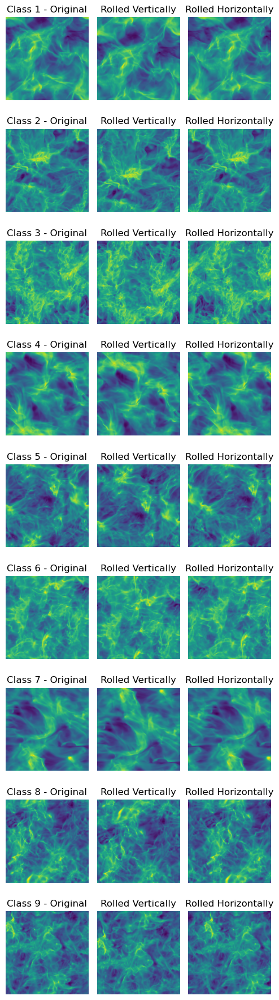

In [11]:
## call the function for ImgsTrain
display_rolled_images(ImgsTrain, NbClasses)

In [12]:
## call the function for ImgsTest
# display_rolled_images(ImgsTest, NbClasses)


## Etape 1: Linear Discriminant Analysis (LDA) avec la moyenne empirique

**1.1 TODO :** Compléter la fonction suivante qui doit retourner un dictionnaire contenant la moyenne de chaque image.

In [13]:
def compute_features_mean(Imgs: dict, NbClasses: int, NbMaps: int) -> dict:
    """
    Computes the mean value of each image for every class.

    Parameters:
        Imgs (dict): A dictionary where each key is a class index (int), and each value
                     is a NumPy array of shape (NbMaps, SizeMaps, SizeMaps), containing the image data.
        NbClasses (int): The number of classes.
        NbMaps (int): The number of maps (images) per class.

    Returns:
        dict: A dictionary where each key is a class index, and each value is a 1D NumPy array
              of length NbMaps, containing the mean value of each map.
    """
    mu_cls = {}  ## initialization of a dictionary to store mean features for each class

    for i in range(1, NbClasses + 1):
        imgs = Imgs[i]  ## get the 3D array of shape (NbMaps, SizeMaps, SizeMaps) for class i

        ## compute the mean of each image
        mu_cls[i] = np.mean(imgs, axis=(1, 2))

    return mu_cls  ## return the dictionary of mean features per class

**1.2 TODO :** Appliquer la fonction précédente pour construire deux dictionnaires associés aux cartes Train et Test. Afficher les valeurs des moyennes et les tracer sur un graphe. A votre avis, la moyenne est-elle un bon marqueur statistique pour classifier ces images ?

In [14]:
## apply compute_features_mean on train & test sets
MeanTrain = compute_features_mean(ImgsTrain, NbClasses, NbMapsTrain)
MeanTest= compute_features_mean(ImgsTest, NbClasses, NbMapsTest)

In [15]:
def plot_means(mu_cls: dict, NbClasses: int):
    """
    Plots the mean pixel values of each image for all classes.

    Parameters:
        mu_cls (dict): A dictionary where each key is a class index (int),
                       and each value is a 1D NumPy array containing the mean pixel values
                       for each image (map) in that class.
        NbClasses (int): The number of classes to plot.

    Returns:
        None: This function displays a plot and does not return anything.
    """
    plt.figure(figsize=(10, 6))  ## create a new figure with specified size

    for i in range(1, NbClasses + 1):
        means = mu_cls[i]  ## get the array of mean values for class i

        ## plot mean values with markers and a label for the legend
        plt.plot(range(1, len(means) + 1), means, marker='o', label=f'Class {i}')

    ## set the title and axis labels
    plt.title("Mean pixel value per image for each class")
    plt.xlabel("Image index")
    plt.ylabel("Mean pixel value")

    ## add a grid and set x-axis ticks to match image indices
    plt.grid(True)
    plt.xticks(np.arange(1, len(means) + 1, 1))

    plt.legend()        ## show legend to distinguish classes
    plt.tight_layout()  ## adjust layout to avoid overlapping elements
    plt.show()          ## display the plot

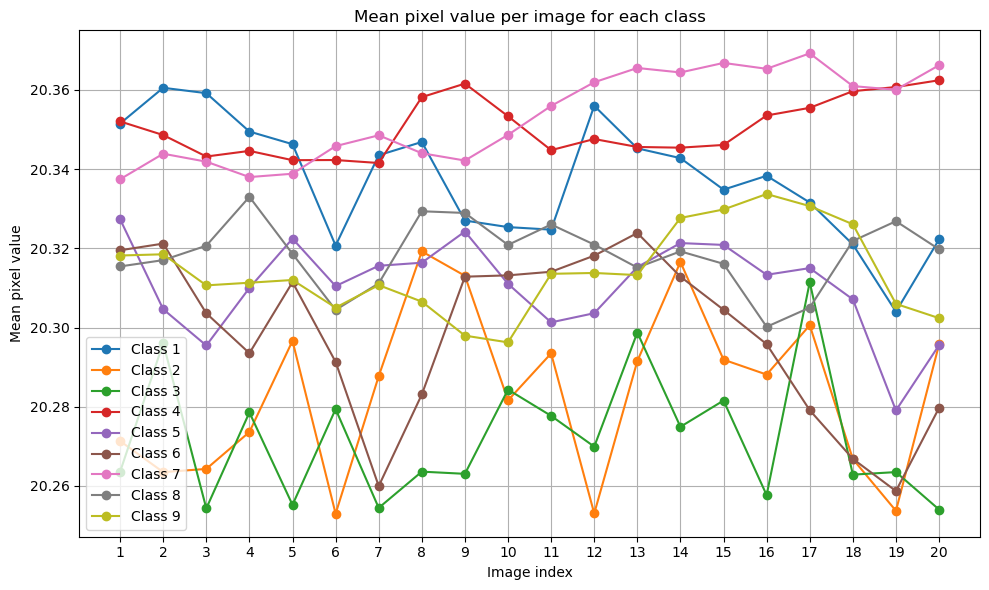

In [16]:
## plot for train images
plot_means(MeanTrain, NbClasses=9)

In [17]:
## plot for test images
# plot_means(MeanTest, NbClasses=9)


**1.3 TODO :** Compléter la fonction suivante qui réalise la classification par LDA. **Cette fonction sera réutilisée dans les TP suivants.** En plus de la LDA, elle devra retourner les matrices de confusion et les test d'accuracy sur les données Train et Test. 

Nous allons utiliser la librairie scikit-learn. Voir éventuellement : https://scikit-learn.org/0.24/auto_examples/classification/plot_lda_qda.html?highlight=lda

Ne pas hésiter à prendre des fonctions toutes faites pour le calcul de confusion et d'accuracy.

In [18]:

def classify_by_LDA(dataTrain: dict, dataTest: dict) -> dict:
    """
    Trains a Linear Discriminant Analysis (LDA) classifier using training data,
    evaluates it on both training and test sets, and returns performance metrics.

    Parameters:
        dataTrain (dict): Training data as a dictionary with class indices as keys
                          and feature arrays as values.
        dataTest (dict): Test data in the same format as dataTrain.

    Returns:
        dict: A dictionary containing:
            - 'train_cm': Confusion matrix on training data
            - 'train_acc': Accuracy on training data
            - 'test_cm': Confusion matrix on test data
            - 'test_acc': Accuracy on test data
            - 'lda': The trained LDA classifier object
    """
    ## convert class-wise dictionaries into flat feature and label arrays
    featuresTrain, labelsTrain = convert_cls2fls(dataTrain, NbClasses, NbMapsTrain)
    featuresTest, labelsTest = convert_cls2fls(dataTest, NbClasses, NbMapsTest)

    clf = LinearDiscriminantAnalysis()  ## create an instance of LDA classifier

    clf.fit(featuresTrain, labelsTrain)  ## train the classifier using training data

    ## make predictions on both training and test sets
    predsTrain = clf.predict(featuresTrain)
    predsTest = clf.predict(featuresTest)

    ## compute confusion matrices to assess classification results
    cmatTrain = confusion_matrix(labelsTrain, predsTrain)
    cmatTest = confusion_matrix(labelsTest, predsTest)

    ## compute accuracy scores for both training and test
    accuracyTrain = accuracy_score(labelsTrain, predsTrain)
    accuracyTest = accuracy_score(labelsTest, predsTest)

    ## return results in a dictionary 
    return {
        'train_cm': cmatTrain,
        'train_acc': accuracyTrain,
        'test_cm': cmatTest,
        'test_acc': accuracyTest,
        'lda': clf
    }

**1.4 TODO :** Appliquer la fonction `classify_by_LDA()` sur les moyennes et afficher les résultats (matrices de confusion et tests d'accuracy sur les données Train et Test). On pourra s'aider de https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html

Train Accuracy: 0.3333333333333333
Test Accuracy : 0.37037037037037035


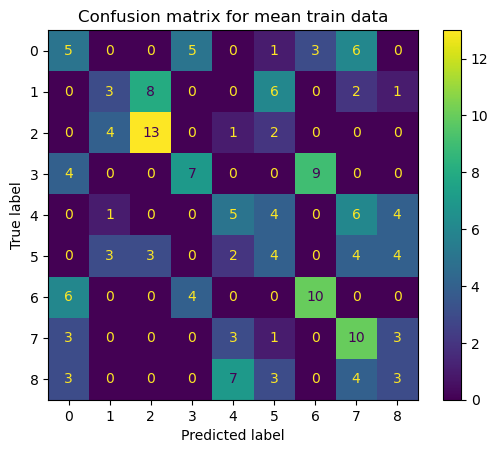

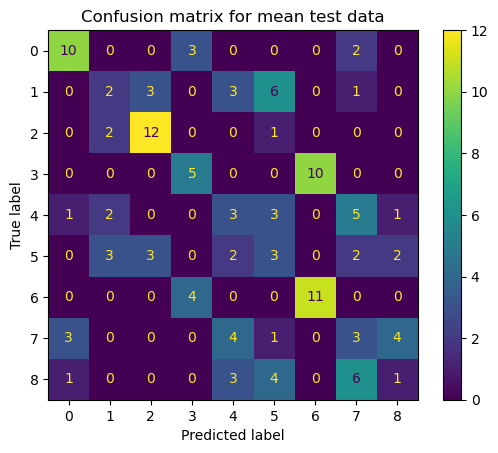

In [19]:
## apply LDA for the empirical mean estimator
resultsMean = classify_by_LDA(MeanTrain, MeanTest)

## print accuracies
print("Train Accuracy:", resultsMean['train_acc'])
print("Test Accuracy :", resultsMean['test_acc'])

## display confusion matrix for mean train data
ConfusionMatrixDisplay(resultsMean['train_cm']).plot()
plt.title("Confusion matrix for mean train data")
plt.show()

## display confusion matrix for mean test data
ConfusionMatrixDisplay(resultsMean['test_cm']).plot()
plt.title("Confusion matrix for mean test data")
plt.show()


1.5 TODO : Commenter le résultat. Naïvement, la moyenne d'échantillon vous semble t'elle être un bon marqueur pour ces données ?

## Etape 2 : LDA avec la matrice d'autocovariance

Autocovariance : https://fr.wikipedia.org/wiki/Autocovariance  
Autocorrélation : https://fr.wikipedia.org/wiki/Autocorr%C3%A9lation

Soit le vecteur translation $\tau = (\tau_1, \tau_2)$ avec $\tau_1 = 0, 1, ... dn$ et $\tau_2 = -dn, ..., -1, 0, 1, ... dn$. On note $X(u)$ la valeur de l'image $X$ en le pixel $u$. L'autocovariance du processus $X$ (supposé à valeurs réelles) est définie par:

$$\phi(u, \tau) = \mathbb{E} [(X(u)-\mu_u)(X(u-\tau)-\mu_{u-\tau})]$$

**2.1 TODO:** Qu'entend on par $\mathbb E$ dans une telle définition ? Que représentent $\mu_u$ et $\mu_{u-\tau}$ ? À quelle condition l'autocovariance ne dépend que de $\tau$ ? Jusitifer alors l'appelation "matrice d'autocovariance" dans notre cas et donner ses dimensions en fonction du choix de $dn$.

**2.2 TODO :** Proposer un estimateur de la matrice d'autocovariance calculé à partir d'une seule image. Ecrire une fonction qui calcule cet estimateur pour un $dn$ donné. La fonction retournera un dictionnaire de numpy arrays où chaque élément correspond à une classe.  

In [20]:
def compute_features_cov(Imgs: dict, dn: int, NbClasses: int, NbMaps: int) -> dict:
    """
    Computes 2D autocovariance-based features for each image in each class.

    For each image, the function calculates a local covariance matrix between each pixel and its
    shifted version for different displacements. The final feature is a flattened version
    of the covariance matrix for use in classification.

    Parameters:
        Imgs (dict): Dictionary where keys are class indices (int) and values are arrays
                     of shape (NbMaps, SizeMaps, SizeMaps) representing the images.
        dn (int): Maximum shift (lag) to compute the autocovariance.
        NbClasses (int): Number of classes.
        NbMaps (int): Number of images per class.

    Returns:
        dict: Dictionary where keys are class indices and values are lists of
              flattened covariance matrices, one per image.
    """
    covmat_cls = {}  ## dictionary to store covariance features for each class

    for i in range(1, NbClasses + 1):
        imgs_cls = Imgs[i]  ## get all images for class i
        cov_list = []       ## list to store feature vectors for this class

        for img in imgs_cls:
            h, w = img.shape
            cov_mat = np.zeros((dn + 1, 2 * dn + 1))     ## autocovariance matrix
            count_mat = np.zeros_like(cov_mat)           ## to count valid contributions
            mean_val = np.mean(img)                      ## mean value of the image

            ## compute autocovariance for each displacement (tau1, tau2)
            for tau1 in range(0, dn + 1):                ## vertical shift
                for tau2 in range(-dn, dn + 1):          ## horizontal shift
                    shifted = np.roll(img, shift=(-tau1, -tau2), axis=(0, 1))  ## shift image

                    ## create mask to ignore wrapped-around parts from np.roll
                    valid_mask = np.ones_like(img, dtype=bool)
                    if tau1 > 0:
                        valid_mask[:tau1, :] = False
                    if tau2 > 0:
                        valid_mask[:, :tau2] = False
                    elif tau2 < 0:
                        valid_mask[:, tau2:] = False

                    ## compute covariance only on valid region
                    diff1 = (img - mean_val)[valid_mask]
                    diff2 = (shifted - mean_val)[valid_mask]
                    cov_val = np.mean(diff1 * diff2)     ## covariance for this shift

                    cov_mat[tau1, tau2 + dn] += cov_val
                    count_mat[tau1, tau2 + dn] += 1       ## count used pixels

            ## normalize by the number of valid pixels per shift
            cov_mat = cov_mat / np.maximum(count_mat, 1)

            cov_list.append(cov_mat.flatten())  ## flatten for classification use

        covmat_cls[i] = cov_list  ## store list of features for class i

    return covmat_cls  ## return the full dictionary of features


**2.3 TODO :** Pour un $dn$ entre 0 et 8, calculer ces estimateurs de matrices de covariance sur les données Train et Test et réaliser une classification par LDA. Tracer les tests d'accuracy en fonction de $dn$. 

Processing dn = 0
Processing dn = 1
Processing dn = 2
Processing dn = 3
Processing dn = 4
Processing dn = 5
Processing dn = 6
Processing dn = 7
Processing dn = 8


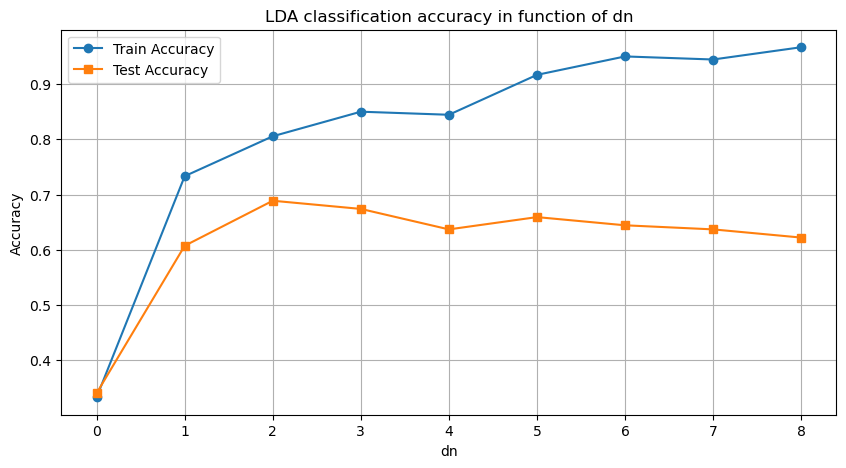

In [21]:
## lists to store training and test accuracies for different values of dn
acc_train_list = []
acc_test_list = []

## loop over different values of dn from 0 to 8
for dn in range(9):
    print(f"Processing dn = {dn}")

    ## compute autocovariance-based features for training and test data
    covTrain = compute_features_cov(ImgsTrain, dn, NbClasses, NbMapsTrain)
    covTest = compute_features_cov(ImgsTest, dn, NbClasses, NbMapsTest)

    ## train and evaluate the LDA classifier
    result = classify_by_LDA(covTrain, covTest)

    ## store the accuracy scores
    acc_train_list.append(result['train_acc'])
    acc_test_list.append(result['test_acc'])

## plot the training and test accuracy as a function of dn
plt.figure(figsize=(10, 5))  ## set figure size
plt.plot(range(9), acc_train_list, label="Train Accuracy", marker='o')  ## training accuracy curve
plt.plot(range(9), acc_test_list, label="Test Accuracy", marker='s')    ## test accuracy curve
plt.xlabel("dn")                ## label for x-axis
plt.ylabel("Accuracy")          ## label for y-axis
plt.title("LDA classification accuracy in function of dn")  ## title of the plot
plt.legend()                   ## add legend to distinguish curves
plt.grid(True)                 ## add grid for better readability
plt.show()                     ## display the plot

**2.4 TODO :** Commenter ces résultats et comparer brièvement à ceux obtenus à l'étape 1.

## Etape 3: LDA en utilisant le spectre de puissance (periodogram)

**3.1 TODO :** Rappeler le lien entre autocovariance et spectre de puissance.

**3.2 TODO :** Ecrire une fonction qui calcule le spectre de puissance de chaque image pour une fréquence maximale notée $dom$. Elle devra retourner un dictionnaire de numpy arrays, chaque élément du dictionnaire étant associé à une classe. On utilisera `fft2` de la librairie `scipy`. Caluler d'abord le spectre de puissance complet puis le tronquer à la fréquence maximale $dom$.

La fonction pourra plotter le spectre de puissance complet et tronqué pour une image en particulier.

In [22]:
from scipy.fft import fft2, fftshift

def compute_features_ps(Imgs: dict, dom: int, NbClasses: int, NbMaps: int, SizeMaps: int) -> dict:
    """
    Computes the centered and cropped power spectrum (frequency-domain features)
    for each image in the dataset.

    Parameters:
        Imgs (dict): Dictionary containing image arrays by class index.
        dom (int): Radius of the frequency domain window to crop around the center.
        NbClasses (int): Number of image classes.
        NbMaps (int): Number of images per class.
        SizeMaps (int): Size (height and width) of each square image.

    Returns:
        dict: Dictionary where each key is a class index and each value is
              an array of cropped power spectrum matrices for that class.
    """
    psmat_cls = {}  ## dictionary to hold cropped power spectra for each class

    for i in range(1, NbClasses + 1):
        ## initialize array to hold the cropped power spectra for each image in class i
        psmat = np.zeros((NbMaps, 2 * dom + 1, 2 * dom + 1))
        
        for j in range(NbMaps):
            img = Imgs[i][j]  ## get the j-th image of class i
            
            ## compute the 2D Fast Fourier Transform
            fft_img = fft2(img)
            
            ## compute the power spectrum
            power_spectrum = np.abs(fft_img) ** 2
            
            ## shift zero-frequency component to the center
            power_spectrum_shifted = fftshift(power_spectrum)
            
            ## crop a (2*dom+1)x(2*dom+1) square region around the center
            center = SizeMaps // 2
            cropped = power_spectrum_shifted[
                center - dom : center + dom + 1,
                center - dom : center + dom + 1
            ]
            
            ## store the cropped spectrum in the array
            psmat[j, :, :] = cropped

            ## plot the full and cropped spectrum for the first image of class 1
            if i == 1 and j == 0:
                plt.figure(figsize=(12, 5))

                plt.subplot(1, 2, 1)
                plt.imshow(np.log(1 + power_spectrum_shifted), cmap='viridis')
                plt.title("Full Power Spectrum")
                plt.colorbar()

                plt.subplot(1, 2, 2)
                plt.imshow(np.log(1 + cropped), cmap='viridis')
                plt.title(f"Cropped Spectrum (dom={dom})")
                plt.colorbar()

                plt.tight_layout()
                plt.show()

        ## store the result for class i
        psmat_cls[i] = psmat

    return psmat_cls


**3.3 TODO :** Quelle plage de valeurs du métaparamètre $dom$ proposez vous d'étudier et pourquoi ? Pour différents choix de $dom$ que vous proposerez, calculer les spectres de puissance sur les données Train et Test. Puis effectuer une classification par LDA. Tracer les tests d'accuracy en fonction de $dom$.

Processing dom = 20


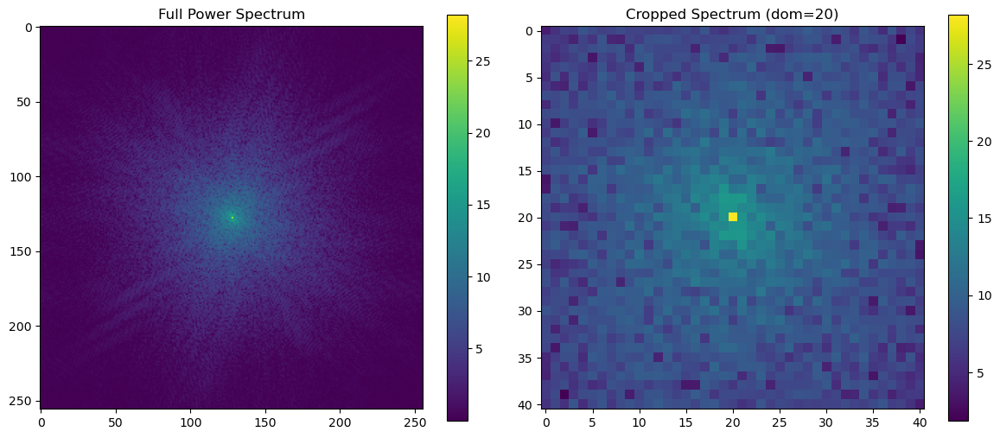

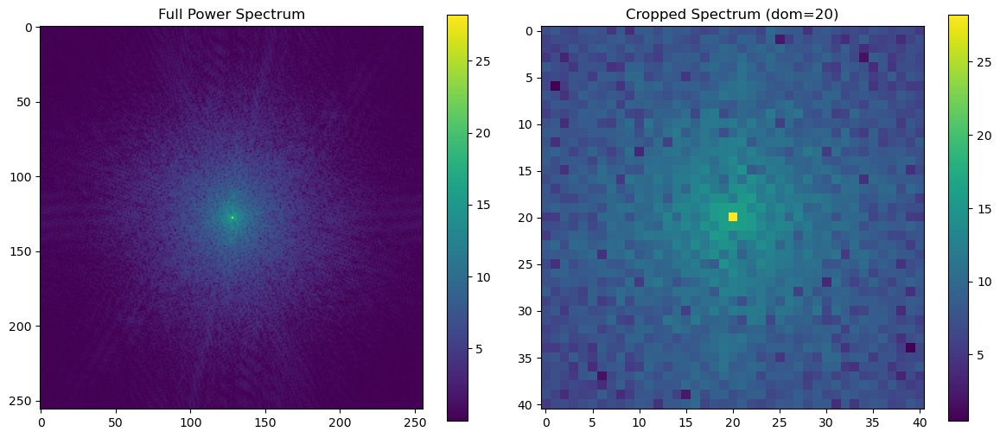

Processing dom = 30


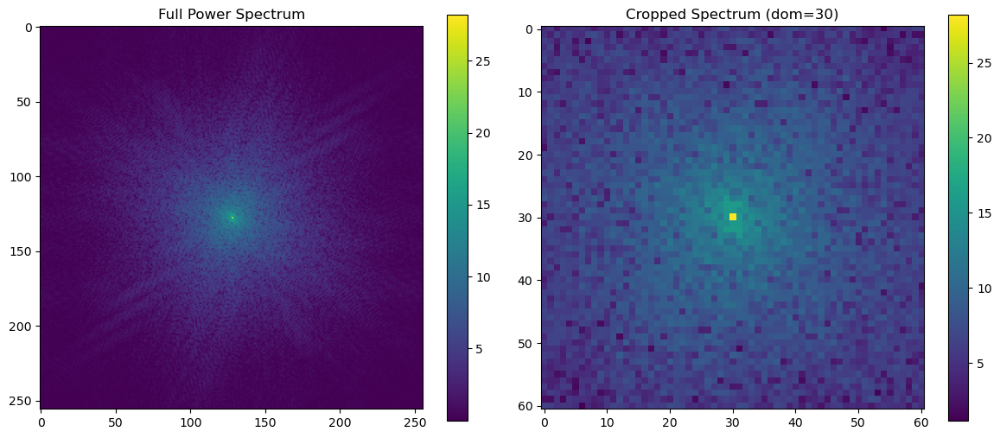

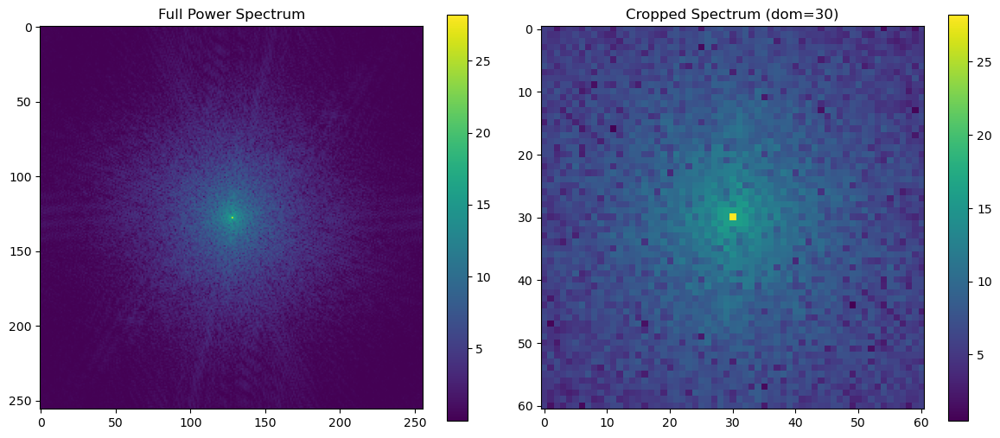

Processing dom = 40


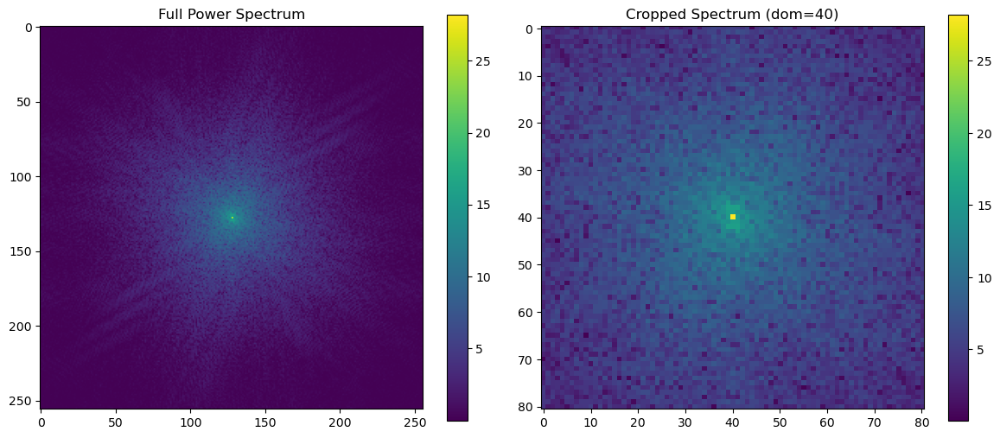

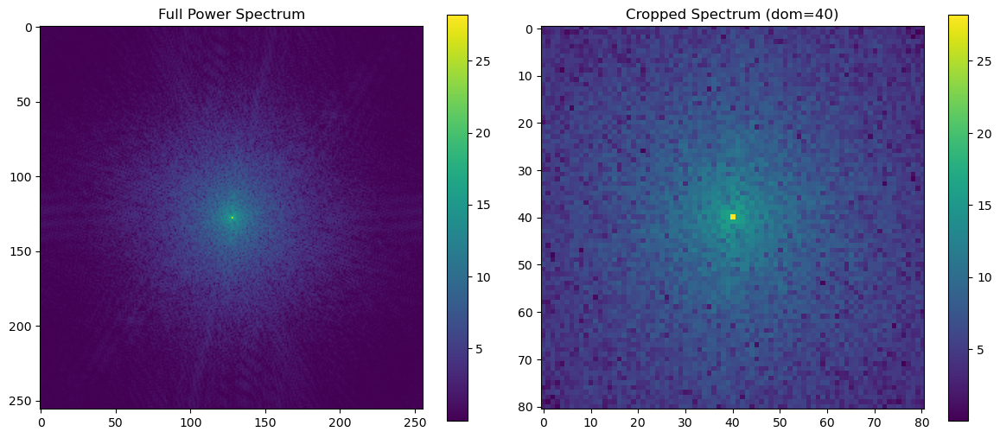

Processing dom = 50


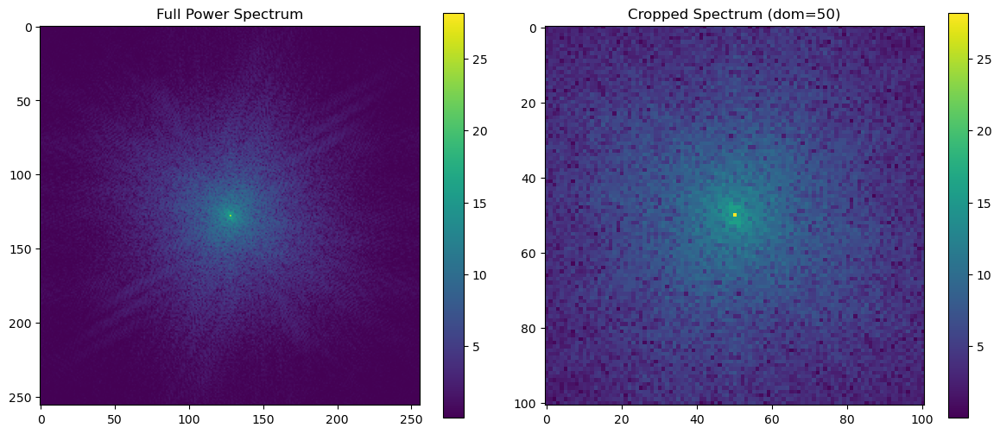

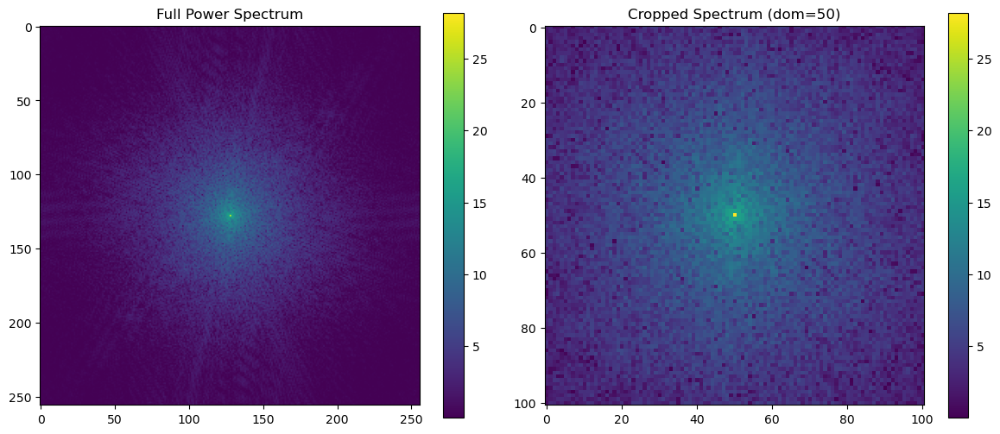

Processing dom = 60


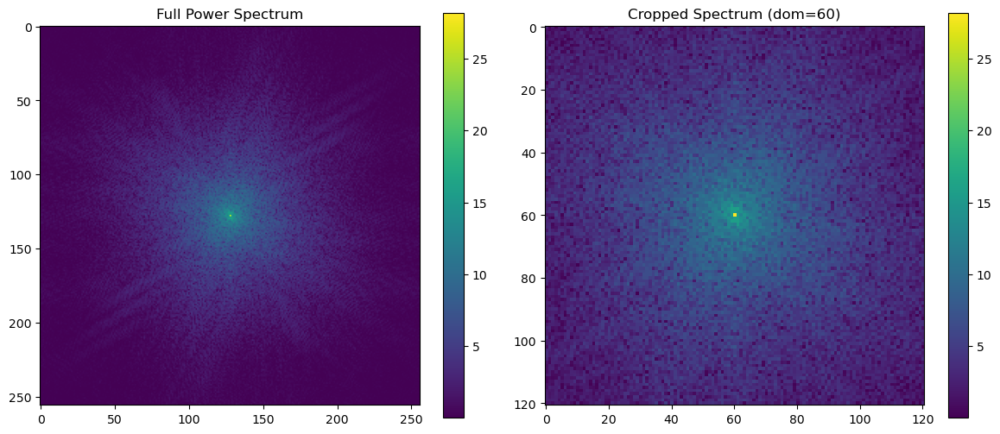

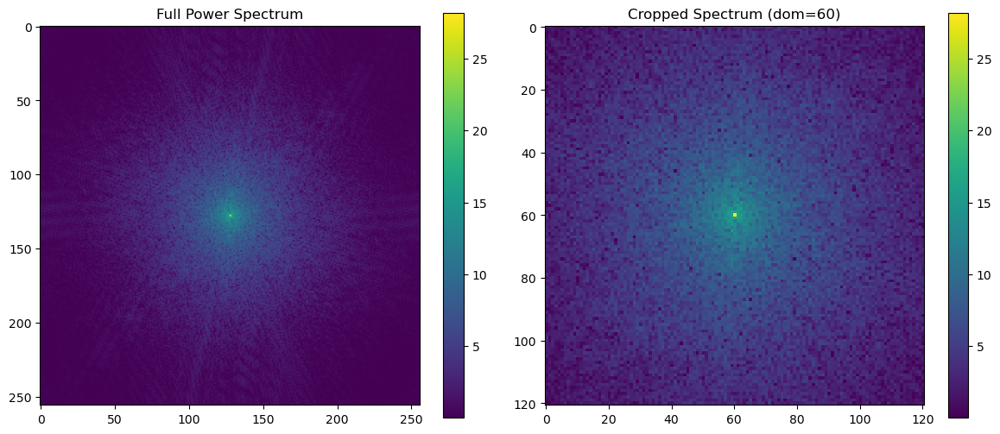

Processing dom = 70


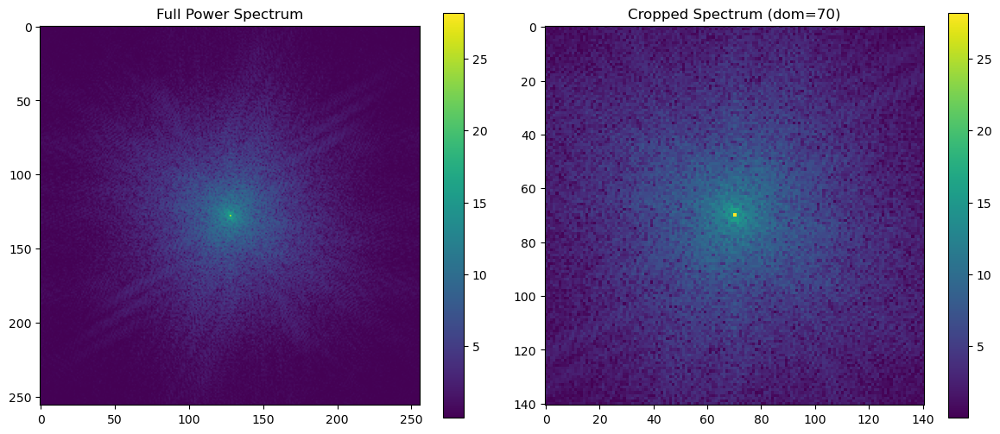

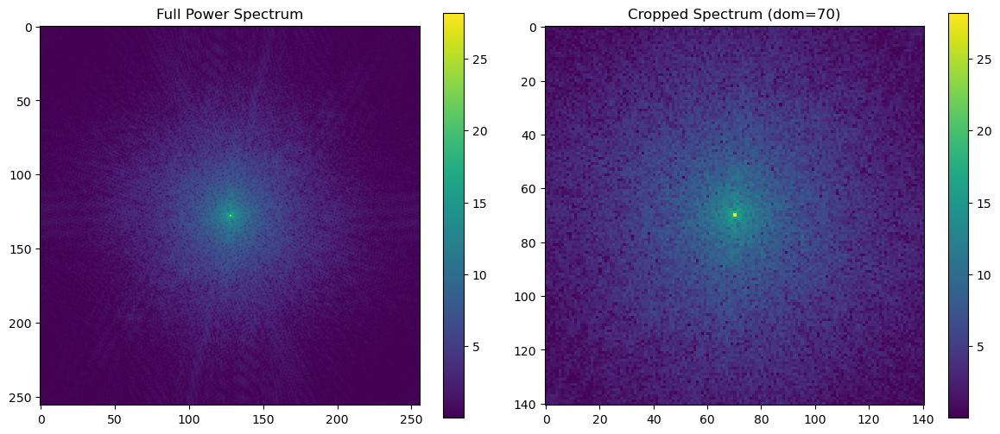

Processing dom = 80


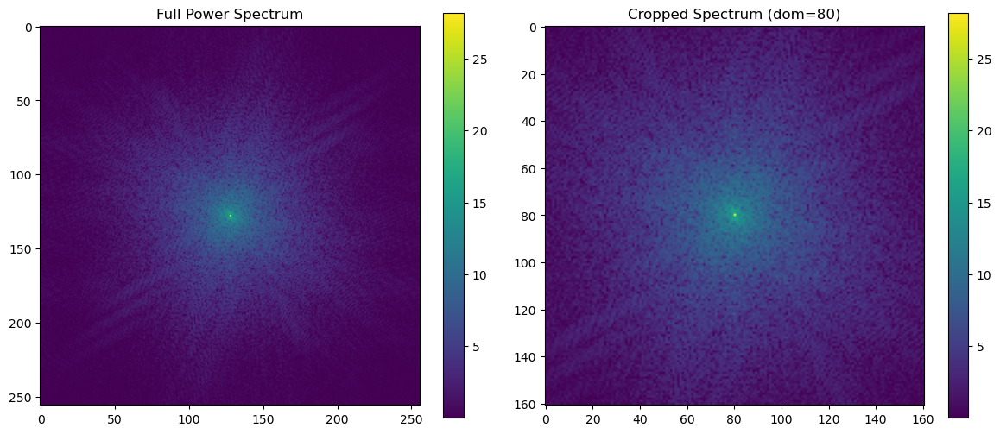

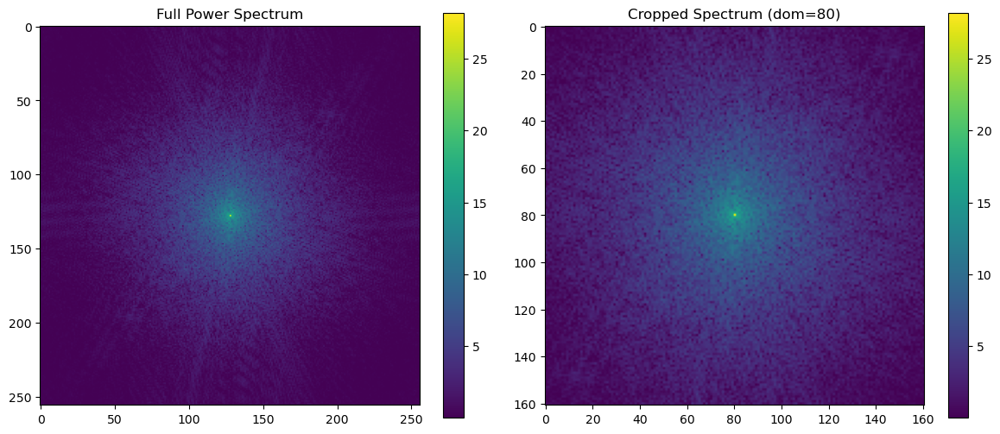

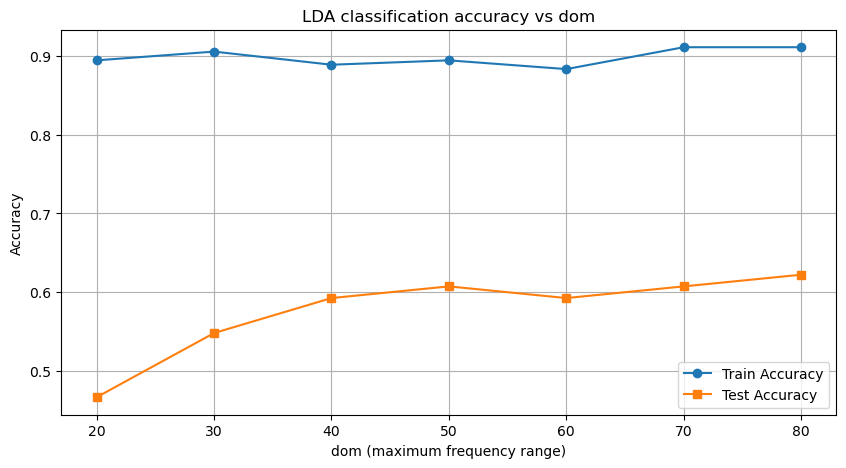

In [23]:
## lists to store classification accuracies
acc_train_list_dom = []
acc_test_list_dom = []

## range of dom values between 20 and 80
dom_values = [20, 30, 40, 50, 60, 70, 80]

for dom in dom_values:
    print(f"Processing dom = {dom}")
    
    ## compute the truncated power spectra for training and test sets
    psTrain = compute_features_ps(ImgsTrain, dom, NbClasses, NbMapsTrain, SizeMaps)
    psTest = compute_features_ps(ImgsTest, dom, NbClasses, NbMapsTest, SizeMaps)

    ## apply LDA
    result = classify_by_LDA(psTrain, psTest)

    ## store the training and test accuracies
    acc_train_list_dom.append(result['train_acc'])
    acc_test_list_dom.append(result['test_acc'])

## plot classification accuracy as a function of dom
plt.figure(figsize=(10, 5))
plt.plot(dom_values, acc_train_list_dom, label="Train Accuracy", marker='o')
plt.plot(dom_values, acc_test_list_dom, label="Test Accuracy", marker='s')
plt.xlabel("dom (maximum frequency range)")
plt.ylabel("Accuracy")
plt.title("LDA classification accuracy vs dom")
plt.legend()
plt.grid(True)
plt.show()


**3.4 TODO :** Commenter ces résultats.

## Etape4: Analyse des performances et conclusion 

Le but de cette section est de comparer les trois classifications LDA réalisées ci-dessus en terme de performances :
- Quelle méthode obtient les meilleurs résultats ?
- Quelle est celle qui a les plus grandes erreurs ?
- Comment l'erreur est-elle reliée à la variance des features choisis ?

Pour aider à répondre à ces questions, on définit la fonction plot suivante :

In [24]:
def plot_mean_per_class(results: dict, dataT: dict, NbMaps: int, title: str, log_yscale: bool):
    ## create the first figure to plot individual features and class means
    fig = plt.figure(figsize=(10,10))
    fig.suptitle(title)  # Overall title for the plot

    ## determine the global min and max for setting consistent y-limits
    ymax = max(list(map(np.max, dataT.values())))
    ymin = min(list(map(np.min, dataT.values())))

    ## loop over each class to create a subplot
    for i in range(1, NbClasses + 1):
        plt.subplot(3, 3, i)  # Arrange subplots in a 3x3 grid (assumes 9 classes)
        
        ## plot each sample’s feature vector in blue
        ## overlay the LDA class mean in red
        if title == 'Empirical mean':
            for j in range(NbMaps):
                features = dataT[i][j].reshape(-1)  ## flatten feature vector
                plt.plot(features, color='b', alpha=0.3, marker='o', linestyle='None', markersize=5)
            plt.plot(results['lda'].means_[i - 1], color='r', marker='o', linestyle='None', markersize=5)
            plt.title(f'Class {i}')
            plt.ylim([ymin, ymax])  ## same y-range across subplots for fair comparison
        else:
            for j in range(NbMaps):
                features = dataT[i][j].reshape(-1)  ## flatten feature vector
                plt.plot(features, color='b', alpha=0.3)
            plt.plot(results['lda'].means_[i - 1], color='r')
            plt.title(f'Class {i}')
            plt.ylim([ymin, ymax])  ## same y-range across subplots for fair comparison

        ## apply log scale to y-axis if specified
        plt.yscale('log') if log_yscale else None

    plt.show()

    ## class mean with error bars (standard deviation)
    fig = plt.figure(figsize=(18, 6))
    fig.suptitle(title)

    for i in range(1, NbClasses + 1):
        ## compute standard deviation of features across images for each class
        errors = np.std(np.array(dataT[i]), axis=0).reshape(-1)
        ## plot LDA mean vector with error bars
        plt.errorbar(x=range(len(results['lda'].means_[i - 1])),
                     y=results['lda'].means_[i - 1],
                     yerr=errors,
                     label=f'class {i - 1}')

    plt.ylim([ymin, ymax])
    if log_yscale:
        plt.yscale('log')

    plt.legend()
    plt.show()

    return


**4.1 TODO :** Conclure sur les performances de la LDA sur ces trois choix de features.

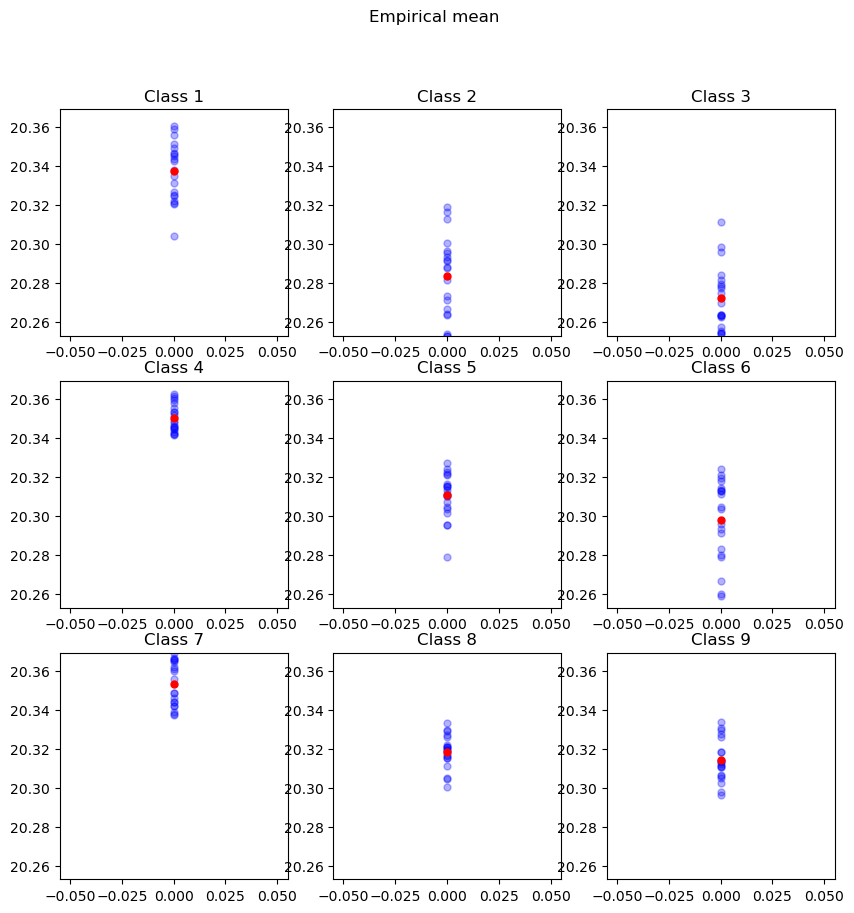

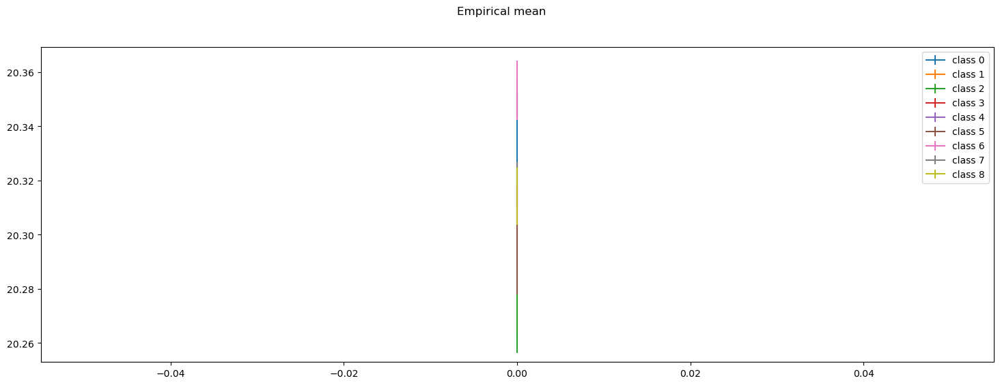

In [25]:
meanTrain = compute_features_mean(ImgsTrain, NbClasses, NbMapsTrain)
meanTest = compute_features_mean(ImgsTest, NbClasses, NbMapsTest)
resultsMean = classify_by_LDA(meanTrain, meanTest)
plot_mean_per_class(resultsMean, meanTrain, NbMapsTrain, title="Empirical mean", log_yscale=False)


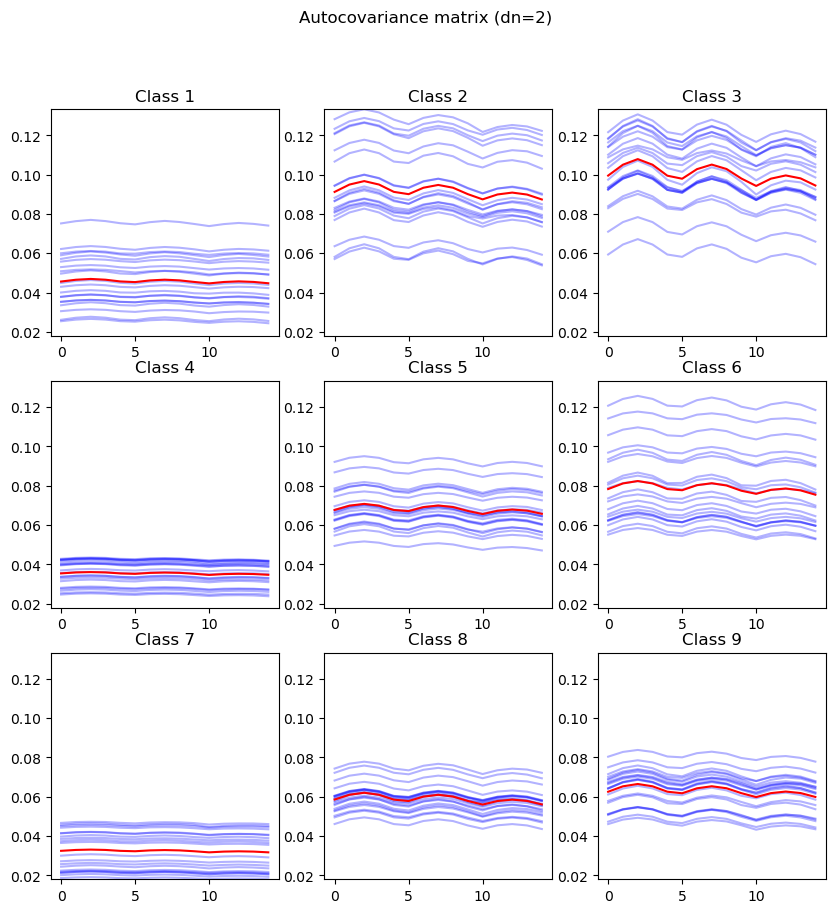

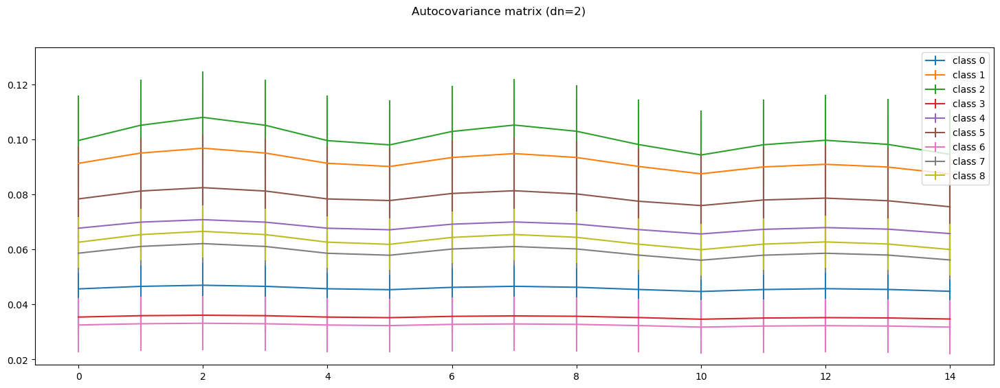

In [26]:
    
covTrain = compute_features_cov(ImgsTrain, 2, NbClasses, NbMapsTrain)
covTest = compute_features_cov(ImgsTest, 2, NbClasses, NbMapsTest)
result = classify_by_LDA(covTrain, covTest)
plot_mean_per_class(result, covTrain, NbMapsTrain, "Autocovariance matrix (dn=2)", log_yscale=False)

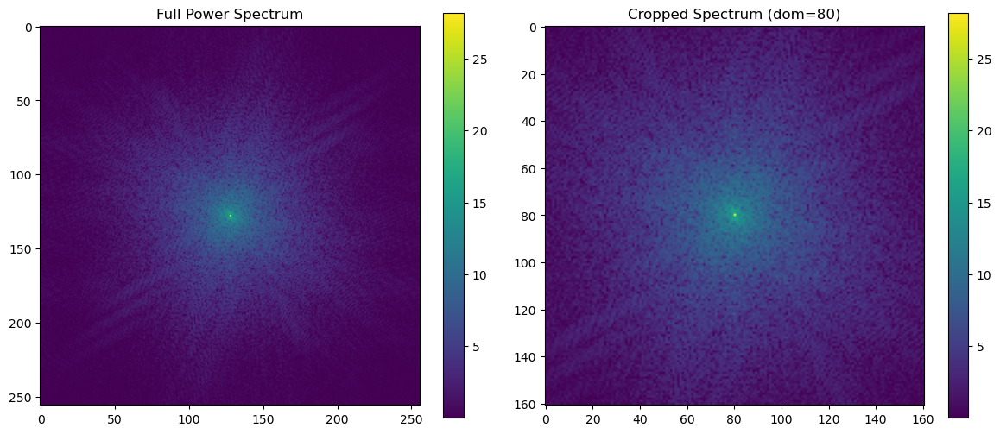

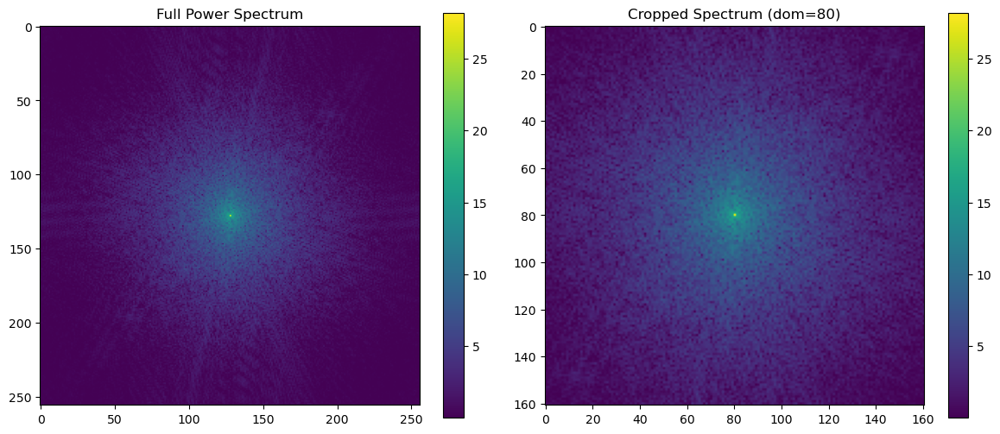

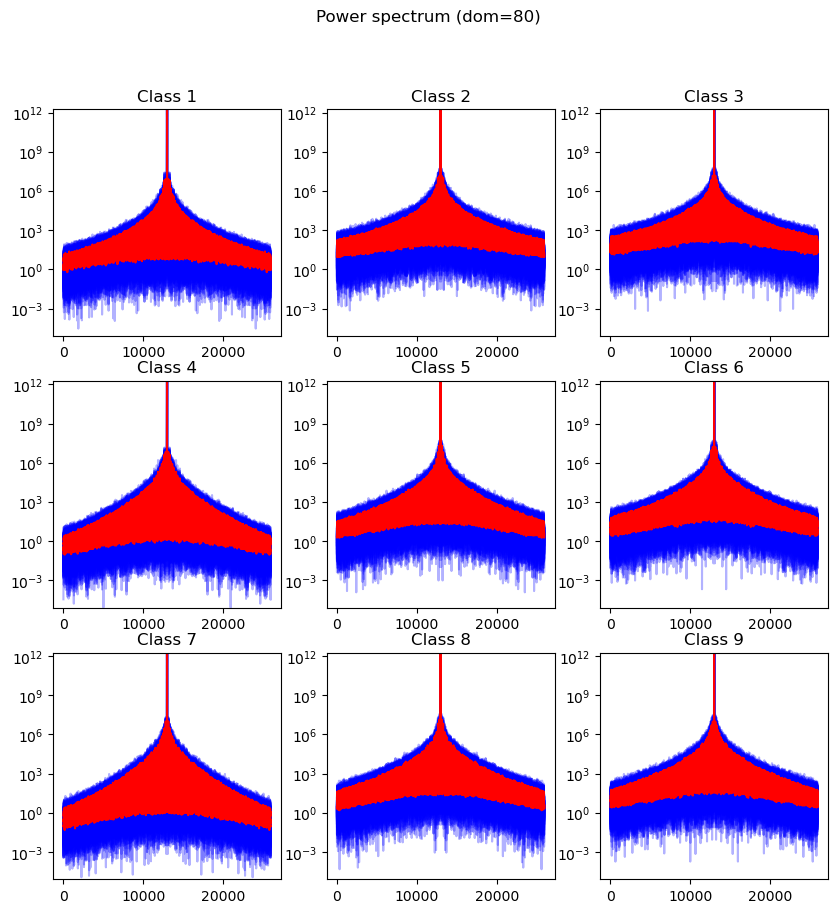

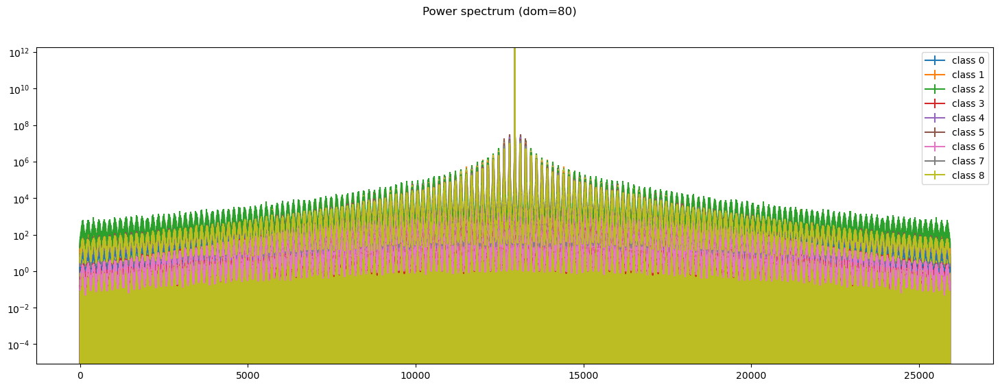

In [27]:
psTrain = compute_features_ps(ImgsTrain, 80, NbClasses, NbMapsTrain, SizeMaps)
psTest = compute_features_ps(ImgsTest, 80, NbClasses, NbMapsTest, SizeMaps)
result = classify_by_LDA(psTrain, psTest)  
plot_mean_per_class(result, psTrain, NbMapsTrain, "Power spectrum (dom=80)", log_yscale=True)


**4.2 TODO :** Quelle invariance de groupe n'a pas été exploitée dans la construction des deux derniers features ?

## Etape 5: Proposition d'une feature

**5.1 TODO :** En se basant sur les analyses précédentes et une exploration complémentaire, proposer une feature compressée avec une bonne accuracy. 

*Cette question est plus ouverte que les autres. Il n'est pas attendu une feature en particulier, mais des choix d'exploration motivés. La mise en application des concepts étudiés dans le cours, la prise en compte des résultats obtenus précédemment, l'effort de recherche et les illustrations seront valorisés.*

### scattering features (invariant par rotation)

In [32]:
import torch
import seaborn as sns
from kymatio.torch import Scattering2D

## check if GPU is available
use_cuda = torch.cuda.is_available()
print('GPU:', use_cuda)

GPU: True


In [33]:
def compute_scattering_features_rot(imgs_dict, J, L, shape):
    """
    Computes second-order 2D scattering features that are invariant to rotation
    by averaging over orientations for a dictionary of class-labeled images.

    Parameters:
        imgs_dict : dict
            A dictionary where each key is a class label and the value is a list of images
            (as 2D numpy arrays) belonging to that class.

        J : int
            The scale parameter for the scattering transform (controls spatial resolution).

        L : int
            The number of angular orientations used in the scattering transform.

        shape : tuple of int
            The spatial dimensions (height, width) of the input images.

    Returns:
        features : dict
            A dictionary where each key is a class label, and each value is a list of
            flattened 1D numpy arrays representing the rotation-invariant scattering
            features of the corresponding images.
    """
    ## initialize the 2D scattering transform with scale J, number of angles L, and image shape
    scattering = Scattering2D(J=J, shape=shape, L=L)
    ## move the scattering transform to CPU
    scattering.to('cpu') 

    features = {}

    ## loop through each class in the dataset
    for cls in imgs_dict:
        class_features = []
        ## loop through each image of the current class
        for img in imgs_dict[cls]:
            ## convert image to a PyTorch tensor, ensure it's on CPU, and add a dummy channel dimension
            img_tensor = torch.tensor(img, dtype=torch.float32, device='cpu').unsqueeze(0)
            ## apply the scattering transform and remove the channel dimension
            S = scattering(img_tensor).squeeze(0).numpy()
            ## average over the orientation dimension to make features rotation-invariant
            S_avg = np.mean(S, axis=0)
            ## flatten the averaged feature map into a 1D feature vector
            class_features.append(S_avg.flatten())

        ## store the list of feature vectors for the current class
        features[cls] = class_features

    return features


In [35]:
## define the range of scale parameters (J) and number of orientations (L) to evaluate
J_values = [1, 2, 4, 6, 8] 
L_values = [1, 2, 4, 6, 8] 

## initialize matrices to store training and test accuracy results
acc_train_matrix = np.zeros((len(J_values), len(L_values))) 
acc_test_matrix = np.zeros((len(J_values), len(L_values)))  

## define the expected shape of the input images
shape = (SizeMaps, SizeMaps)

## loop over all combinations of J and L
for i, J in enumerate(J_values):
    for j, L in enumerate(L_values):
        print(f"Processing J={J}, L={L}")  # Print progress

        ## compute scattering features (rotation-invariant) for training and test images
        feat_train = compute_scattering_features_rot(ImgsTrain, J, L, shape)  
        feat_test  = compute_scattering_features_rot(ImgsTest,  J, L, shape) 

        ## perform classification using LDA
        result = classify_by_LDA(feat_train, feat_test)

        ## store accuracy values in the corresponding matrix positions 
        acc_train_matrix[i, j] = result['train_acc'] 
        acc_test_matrix[i, j] = result['test_acc'] 


Processing J=1, L=1
Processing J=1, L=2
Processing J=1, L=4
Processing J=1, L=6
Processing J=1, L=8
Processing J=2, L=1
Processing J=2, L=2
Processing J=2, L=4
Processing J=2, L=6
Processing J=2, L=8
Processing J=4, L=1
Processing J=4, L=2
Processing J=4, L=4
Processing J=4, L=6
Processing J=4, L=8
Processing J=6, L=1
Processing J=6, L=2
Processing J=6, L=4
Processing J=6, L=6
Processing J=6, L=8
Processing J=8, L=1
Processing J=8, L=2
Processing J=8, L=4
Processing J=8, L=6
Processing J=8, L=8


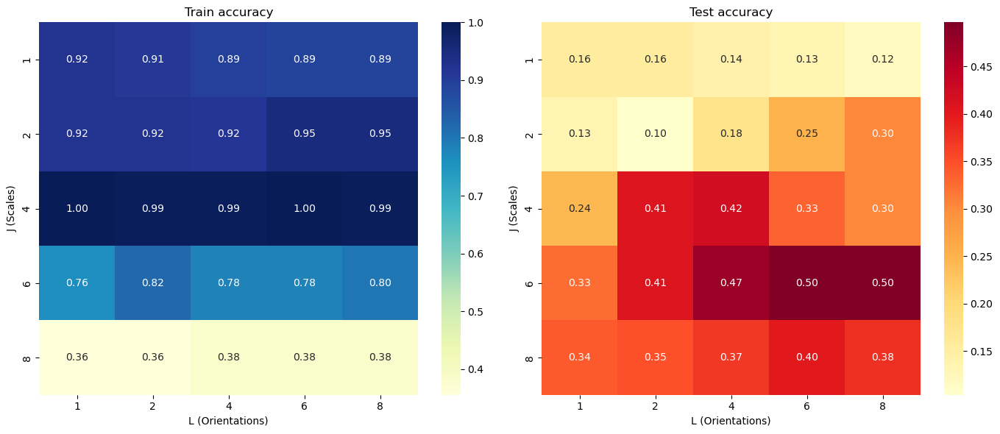

In [36]:
## create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

## first heatmap using acc_train_matrix
sns.heatmap(acc_train_matrix, annot=True, fmt=".2f", xticklabels=L_values, yticklabels=J_values, cmap="YlGnBu", ax=axs[0])

## add labels and title to the first subplot
axs[0].set_title("Train accuracy")
axs[0].set_xlabel("L (Orientations)")
axs[0].set_ylabel("J (Scales)")

## second heatmap using acc_test_matrix
sns.heatmap(acc_test_matrix, annot=True, fmt=".2f", xticklabels=L_values, yticklabels=J_values, cmap="YlOrRd", ax=axs[1])

## add labels and title to the second subplot
axs[1].set_title("Test accuracy")
axs[1].set_xlabel("L (Orientations)")
axs[1].set_ylabel("J (Scales)")

## automatically adjust spacing between plots
plt.tight_layout()

## display both heatmaps
plt.show()


In [ ]:
## rerun with L & J that gave the best results
feat_train = compute_scattering_features_rot(ImgsTrain, J = 6, L = 8, shape=(SizeMaps, SizeMaps))
feat_test  = compute_scattering_features_rot(ImgsTest,  J = 6, L = 8, shape=(SizeMaps, SizeMaps))
result = classify_by_LDA(feat_train, feat_test)  

In [65]:
def plot_first_image_per_class(features_dict, J, L):
    """
    Plot the feature vector of the first image in each class.

    Parameters:
        features_dict (dict): Dictionary where keys are class IDs and values are lists of feature vectors.
        J (int): The scale parameter for the scattering transform (controls spatial resolution).
        L (int): The number of angular orientations used in the scattering transform.
    """
    num_classes = len(features_dict)  ## determine how many classes are in the dictionary

    ## create a figure large enough to show all subplots vertically
    plt.figure(figsize=(12, num_classes * 2.5))  ## adjust the height dynamically based on number of classes

    ## iterate over each class in sorted order 
    for i, class_id in enumerate(sorted(features_dict.keys()), 1):
        feature_vec = features_dict[class_id][0].reshape(-1)  ## select and flatten the feature vector of the first image in the class

        ## create a subplot for the current class
        plt.subplot(num_classes, 1, i)
        plt.plot(feature_vec, marker='o', markersize=2)  ## plot the feature vector
        plt.title(f"Scattering features – Class {class_id} - J = {J} & L = {L}")  ## title specific to the class
        plt.xlabel("Feature index")  ## X-axis label
        plt.ylabel("Feature value")  ## Y-axis label
        plt.grid(True)  ## add grid for readability

    ## automatically adjust layout so subplots do not overlap
    plt.tight_layout()
    plt.show()  ## display all subplots


In [74]:
# feat_example = compute_scattering_features_rot(ImgsTrain, J = 1, L = 2, shape=(SizeMaps, SizeMaps))
# plot_first_image_per_class(feat_example, J = 1, L = 2)

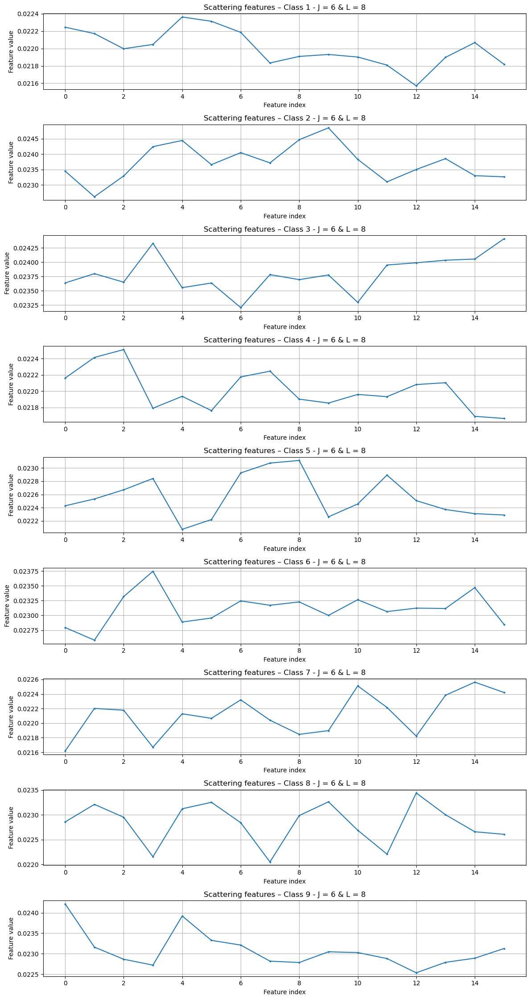

In [69]:
plot_first_image_per_class(feat_train, J = 6, L = 8)

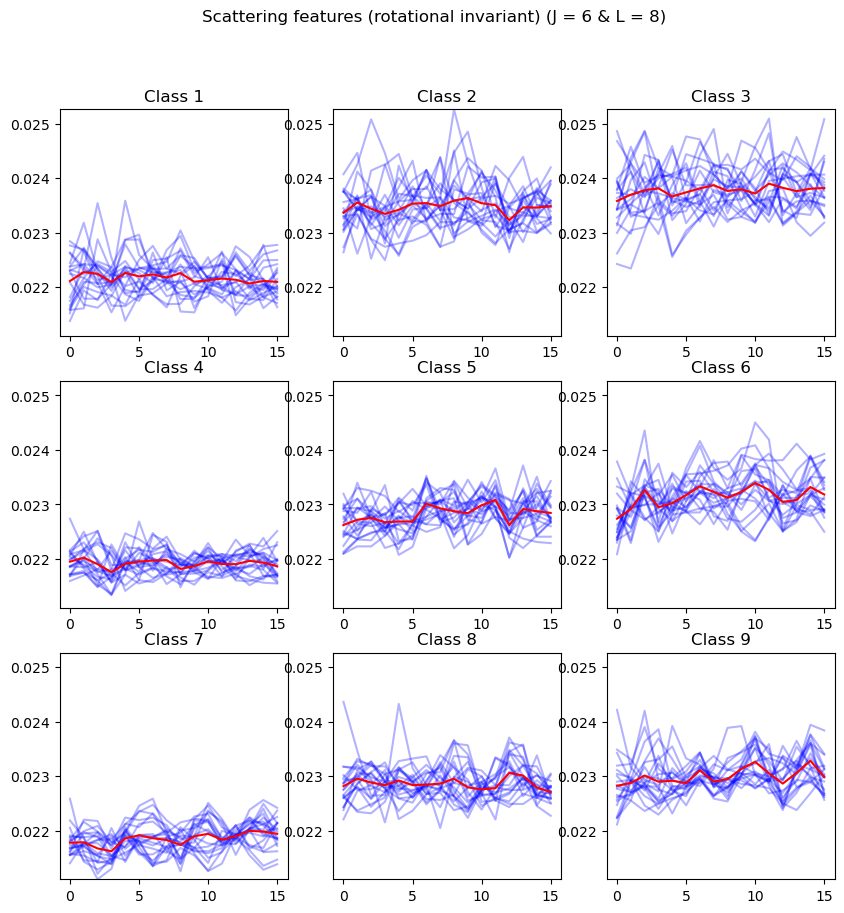

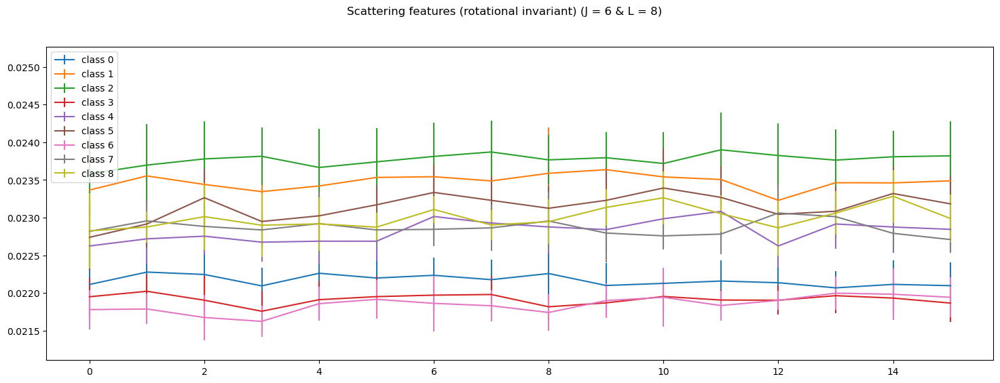

In [47]:
plot_mean_per_class(result, feat_train, NbMapsTrain, "Scattering features (rotational invariant) (J = 6 & L = 8)", log_yscale=False)


### scattering features (invariant par translation)

In [ ]:
def compute_scattering_features_trans(imgs_dict, J, L, shape):
    """
    Compute translation-invariant 2D scattering transform features for a set of images,
    without applying rotation invariance.

    Parameters:
        imgs_dict (dict): Dictionary where keys are class labels and values are lists of images (numpy arrays).
        J (int): Scale of the scattering transform (number of layers).
        L (int): Number of angular directions (orientations).
        shape (tuple): Shape of the input images (height, width).

    Returns:
        dict: A dictionary where each key is a class label and each value is a list of flattened feature vectors
              (one per image in the class).
    """
    ## initialize the 2D scattering transform with specified parameters
    scattering = Scattering2D(J=J, shape=shape, L=L)
    ## ensure the scattering transform is performed on the CPU
    scattering.to('cpu') 

    ## dictionary to store features per class
    features = {}

    ## loop through each class in the dataset
    for cls in imgs_dict:
        class_features = []
        ## loop through each image in the current class
        for img in imgs_dict[cls]:
            ## convert image to a float32 PyTorch tensor on CPU and add a dummy channel dimension
            img_tensor = torch.tensor(img, dtype=torch.float32, device='cpu').unsqueeze(0)
            ## apply the scattering transform and flatten the result into a 1D vector
            S = scattering(img_tensor).numpy().flatten()
            ## append the feature vector to the class-specific list
            class_features.append(S)
        
        ## store the list of feature vectors for this class
        features[cls] = class_features

    return features

In [72]:
## define the range of scale parameters (J) and number of orientations (L) to evaluate
J_values_trans = [1, 2, 4, 6]
L_values_trans = [1, 2, 4, 6]

## initialize matrices to store training and test accuracy results
acc_train_matrix_trans = np.zeros((len(J_values_trans), len(L_values_trans)))
acc_test_matrix_trans = np.zeros((len(J_values_trans), len(L_values_trans)))

## define the expected shape of the input images
shape = (SizeMaps, SizeMaps)

## loop over all combinations of J and L
for i, J in enumerate(J_values_trans):
    for j, L in enumerate(L_values_trans):
        print(f"Processing J={J}, L={L}")
        
        ## compute scattering features (translation-invariant) for training and test images
        feat_train_trans = compute_scattering_features_trans(ImgsTrain, J, L, shape)
        feat_test_trans  = compute_scattering_features_trans(ImgsTest,  J, L, shape)

        ## perform classification using LDA
        result = classify_by_LDA(feat_train_trans, feat_test_trans)

        ## store accuracy values in the corresponding matrix positions 
        acc_train_matrix_trans[i, j] = result['train_acc']
        acc_test_matrix_trans[i, j] = result['test_acc']


Processing J=1, L=1
Processing J=1, L=2
Processing J=1, L=4
Processing J=1, L=6
Processing J=2, L=1
Processing J=2, L=2
Processing J=2, L=4
Processing J=2, L=6
Processing J=4, L=1
Processing J=4, L=2
Processing J=4, L=4
Processing J=4, L=6
Processing J=6, L=1
Processing J=6, L=2
Processing J=6, L=4
Processing J=6, L=6


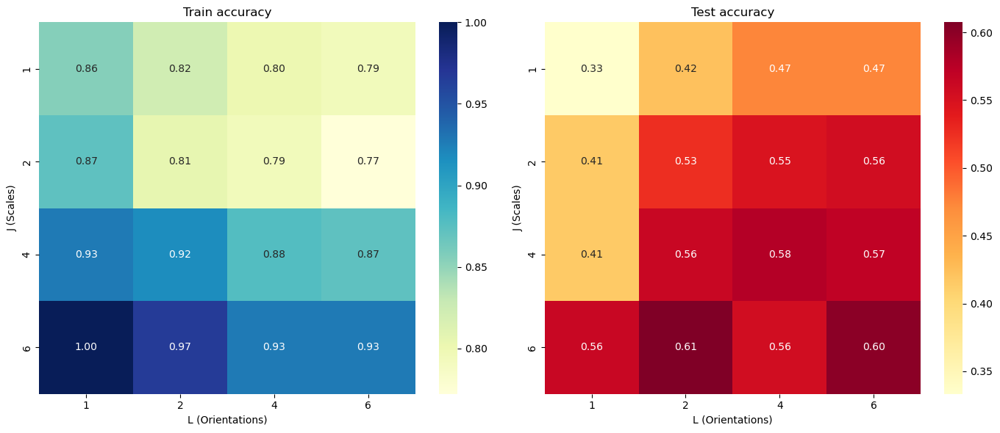

In [73]:
## create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

## first heatmap using acc_train_matrix
sns.heatmap(acc_train_matrix_trans, annot=True, fmt=".2f", xticklabels=L_values_trans, yticklabels=J_values_trans, cmap="YlGnBu", ax=axs[0])

## add labels and title to the first subplot
axs[0].set_title("Train accuracy")
axs[0].set_xlabel("L (Orientations)")
axs[0].set_ylabel("J (Scales)")

## second heatmap using acc_test_matrix
sns.heatmap(acc_test_matrix_trans, annot=True, fmt=".2f", xticklabels=L_values_trans, yticklabels=J_values_trans, cmap="YlOrRd", ax=axs[1])

## add labels and title to the second subplot
axs[1].set_title("Test accuracy")
axs[1].set_xlabel("L (Orientations)")
axs[1].set_ylabel("J (Scales)")

## automatically adjust spacing between plots
plt.tight_layout()

## display both heatmaps
plt.show()
